# Segmentation

The goal of this homework is to study some segmentation approaches that do not rely heavily on training processes. In practice, these approaches are useful in situations where no large database of images with associated groundtruth is available. We will also study the use of multiscale decomposition with linear and nonlinear filters as simplification prior to the segmentation. 

A specfic set of images is provided for this lab session. This set corresponds to fluorescence microscopy images of the human osteosarcoma U2OS cell line used in various areas of biomedical research. Segmentation is an important step in the pipeline of many cytometric analyses.

---



## 1 Lab configuration

As usual, let us first import the necessary python libraries. We also define the functions to display images and a new one to display label images. Label images are going to be used to visualize the regions of a partition. In order to clearly see the difference between two regions that may have been assigned similar label values, we use a random color map. Each time the function is called, a new random map is generated. So if you do not manage to see well a given partition, try to visualize it again with a second call. 

In [175]:

!python -m pip install -U scikit-image

In [176]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from skimage import io, transform, morphology, filters, segmentation, measure
from scipy import ndimage as nd
  
def display_image(img_in, title='', size=None):
  img = img_in.astype(np.double)

  plt.gray()
  h = plt.imshow(img, interpolation='none')
  if size:
    dpi = h.figure.get_dpi()/size
    h.figure.set_figwidth(img.shape[1] / dpi)
    h.figure.set_figheight(img.shape[0] / dpi)
    h.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)
    h.axes.set_position([0, 0, 1, 1])
    h.axes.set_xlim(-1, img.shape[1])
    h.axes.set_ylim(img.shape[0], -1)
  plt.grid(False)
  plt.title(title)  
  plt.show()

def display_label(img, title='', size=None):
  h, ax = plt.subplots()
  #ax.imshow(img, cmap=plt.cm.nipy_spectral, interpolation='nearest')
  cmap = colors.ListedColormap (np.random.rand (256,3))
  ax.imshow(img, cmap=cmap, interpolation='nearest')
  if size:
    dpi = ax.figure.get_dpi()/size
    ax.figure.set_figwidth(img.shape[1] / dpi)
    ax.figure.set_figheight(img.shape[0] / dpi)
    ax.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)
    ax.axes.set_position([0, 0, 1, 1])
    ax.axes.set_xlim(-1, img.shape[1])
    ax.axes.set_ylim(img.shape[0], -1)
  plt.grid(False)
  plt.title(title)  
  plt.show()

Upload the DNA.zip file and uncompress it.

In [177]:
#!unzip -q DNA.zip

## 2 Load an image

Load a random image of the dataset. The images are named "dna-xx.png". The value of xx is an arbitrary number between 00 and 32. Choose the value in the first line of the code cell. 

The first steps consist in reducing its size by a factor 2 and in normalizing its gray level values between 0 and 1.
 

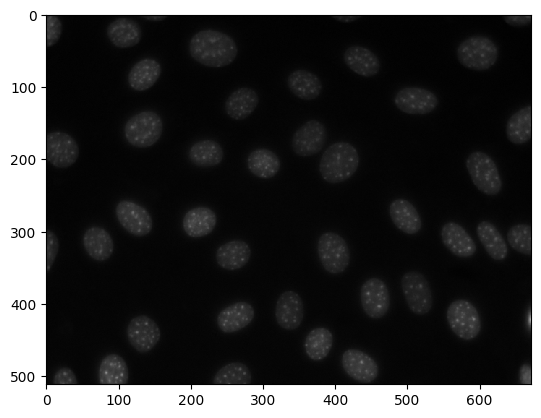

In [178]:
#image 10:
ima = io.imread('/Users/aliag/Downloads/DNA/dna-10.png',as_gray=True)
#image 22:
# ima = io.imread('/Users/aliag/Downloads/DNA/dna-22.png',as_gray=True)
ima = transform.resize(ima,np.divide(ima.shape,2).astype(int),mode='reflect') 
ima = ima/np.amax(ima)
display_image(ima)

## 3 Multiscale Decomposition

In the second lab session (Lab_Multiscale), we have analyzed the multiscale decomposition of an image with the following scheme: 

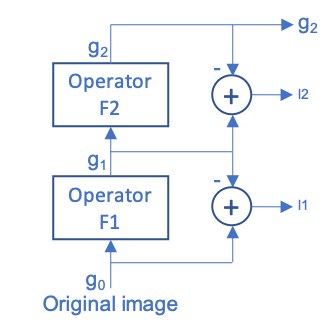

If the $F_i$ operators are Gaussian filters, the $g_n$ images are called Gaussian and the $l_n$ images are called Laplacian. However, the scheme can be used with any kind of operators. In fact, the equality: $g_0 = l_1 + l_2 + g_2$ is true for any operator $F_i$. The set of $l_i$ images constitutes a multiscale decomposition of the content of the original image. Changing the definition of the operators, we are able to modify the decomposition criterion. The function `MultiResolution`: 

`l1, l2, g2 = MultiResolution (image, filter, p1, p2)`

computes a multiscale decomposition of the input image `image` in with filters defined by `filter` and parameters `pi`. The result of the decomposition is the set of images: `l1, l2 and g2`. The function parameters can take the following values: 

>Operator | Filter name | Meaning of `p1,p2`
>--- | --- | - 
> Low-pass (Gaussian) filter | `gaussian` | Sigma of the Gaussian
> Erosion | `erosion` | Size of the structuring element (disk)
> Dilation | `dilation` | Idem
> Opening | `opening` | Idem
> Closing | `closing` | Idem
>Alternating filter (closing(opening(.)) | `alternating` | Idem
> Opening by reconstruction of erosion | `opening_rec` |Idem
> Closing by reconstruction of dilation | `closing_rec` | Idem
> Alternating filter (closing(opening(.)) by reconstruction | `alternating_rec` | Idem
      




In [179]:
def MultiResolution(ima, filter, p1, p2):
  g0 = ima
  if filter == 'gaussian':
    g1 = filters.gaussian(g0,sigma=p1)
    g2 = filters.gaussian(g1,sigma=p2)
  elif filter == 'erosion':
    g1 = morphology.erosion(g0,morphology.disk(p1))
    g2 = morphology.erosion(g1,morphology.disk(p2))
  elif filter == 'dilation':
    g1 = morphology.dilation(g0,morphology.disk(p1))
    g2 = morphology.dilation(g1,morphology.disk(p2))
  elif filter == 'opening':
    g1 = morphology.opening(g0,morphology.disk(p1))
    g2 = morphology.opening(g1,morphology.disk(p2))
  elif filter == 'closing':
    g1 = morphology.closing(g0,morphology.disk(p1))
    g2 = morphology.closing(g1,morphology.disk(p2))
  elif filter == 'alternating':
    tm = morphology.opening(g0,morphology.disk(p1))
    g1 = morphology.closing(tm,morphology.disk(p1))    
    tm = morphology.opening(g1,morphology.disk(p2))
    g2 = morphology.closing(tm,morphology.disk(p2))
  elif filter == 'opening_rec':
    tm = morphology.erosion(g0,morphology.disk(p1))
    g1 = morphology.reconstruction(tm,g0,method='dilation')
    tm = morphology.erosion(g1,morphology.disk(p2))
    g2 = morphology.reconstruction(tm,g1,method='dilation')
  elif filter == 'closing_rec':
    tm = morphology.dilation(g0,morphology.disk(p1))
    g1 = morphology.reconstruction(tm,g0,method='erosion')
    tm = morphology.dilation(g1,morphology.disk(p2))
    g2 = morphology.reconstruction(tm,g1,method='erosion')
  elif filter == 'alternating_rec':
    tm = morphology.erosion(g0,morphology.disk(p1))
    tn = morphology.reconstruction(tm,g0,method='dilation')
    tm = morphology.dilation(tn,morphology.disk(p1))
    g1 = morphology.reconstruction(tm,tn,method='erosion')
    tm = morphology.erosion(g1,morphology.disk(p2))
    tn = morphology.reconstruction(tm,g1,method='dilation')
    tm = morphology.dilation(tn,morphology.disk(p2))
    g2 = morphology.reconstruction(tm,tn,method='erosion')
  else:       
    print('Unknown filter')
  l1 = g0 - g1
  l2 = g1 - g2
  return l1, l2, g2
  

In order to remember the results of the second lab session, analyze the image with Gaussian filters and display the resulting Gaussian and Laplacian decompositions. 

L1


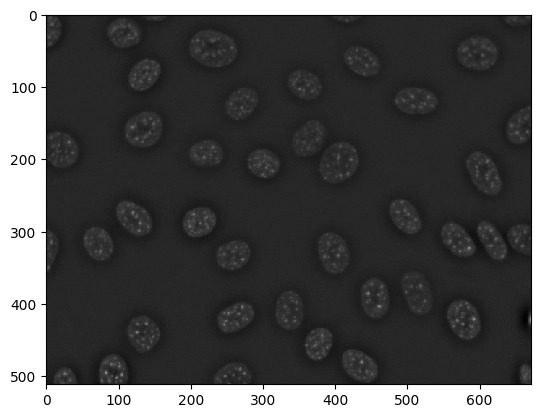

L2


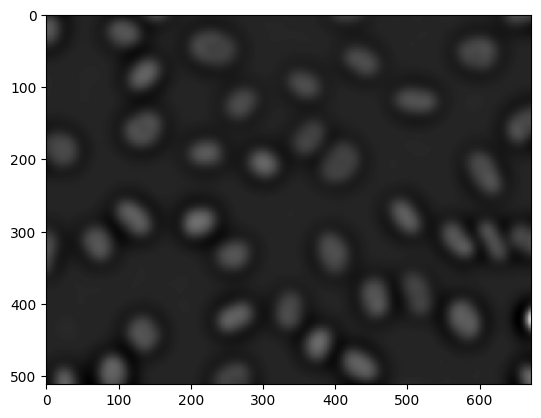

G2


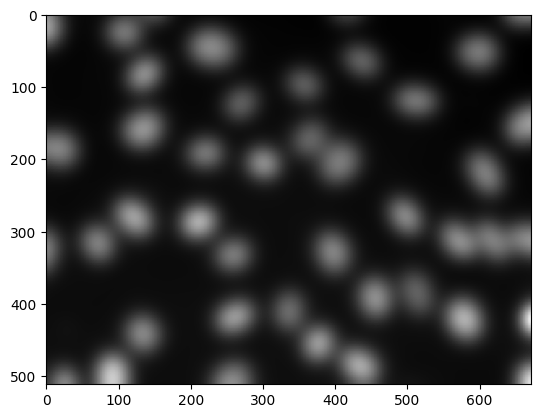

L1+L2+G2


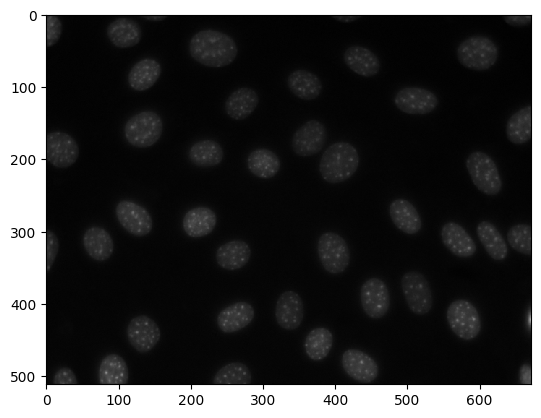

In [180]:
l1, l2, g2 = MultiResolution(ima,'gaussian',9,9)
print("L1")
display_image(l1)
print("L2")
display_image(l2)
print("G2")
display_image(g2)
print("L1+L2+G2")
display_image(l1+l2+g2)

The first three images respectively represent $l_1, l_2$ and $g_2$. The last image is the sum  $l_1 + l_2 + g_2$ which is exactly the original image. 

Images $l_1, l_2$ and $g_2$ represent a decomposition of the original image in three frequency bands. $l_1$  concentrates the high frequency components,  $g_2$ has the low frequencies and $l_2$  the intermediate frequency components. 

Test now the decomposition with alternating filters with structuring elements of size 5 and 5. 


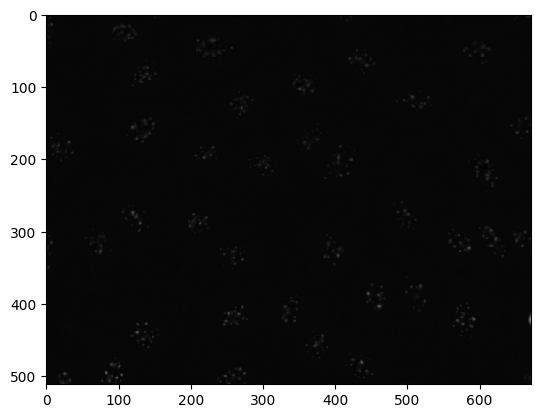

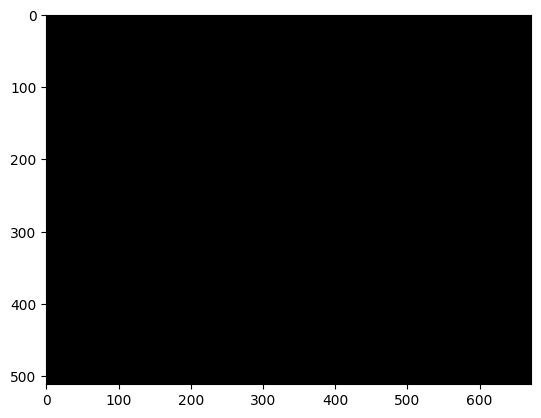

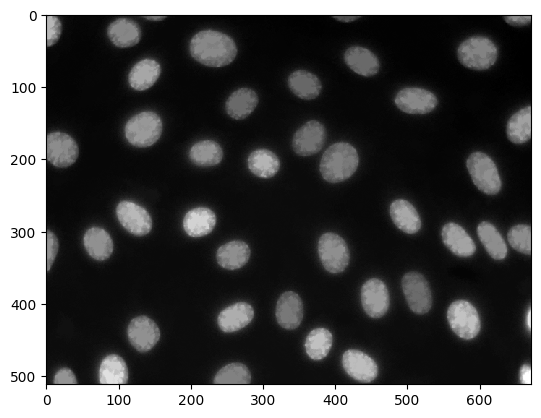

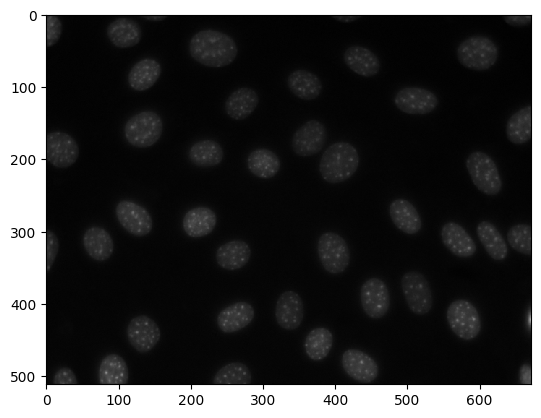

In [181]:
l1, l2, g2 = MultiResolution(ima,'alternating_rec',5,5)
display_image(l1)
display_image(l2)
display_image(g2)
display_image(l1+l2+g2)

<font color='purple'> Can you explain why l2 is equal to zero? Does this result depends on the particuliar image we are processing?: </font>

---
<font color='red'>Answer: 
L2 is equal to 0 due to the fact that the second filter does not take action in the output of the first filter, meaning g1=g2. This happens because we assigned the same parameters in both filters and since alternate_rec is idempotent, when appplying F2 the result is the same. Then, it does not depend on the image we are processing, it depends on the parameters we are using for the filter and if this filter is idempotent or not.
</font> 

Test now the decomposition with alternating filters with structuring elements of size 5 and 17.

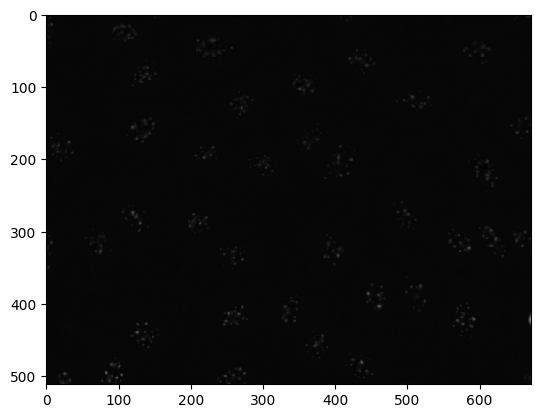

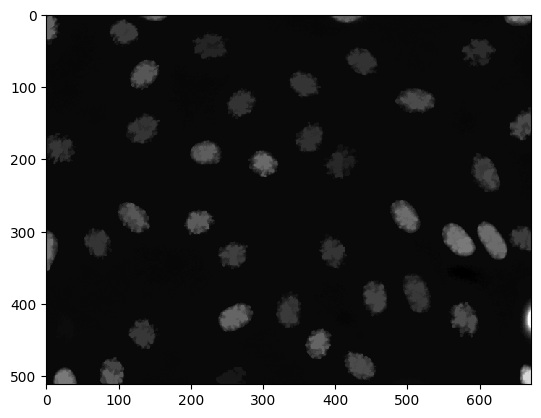

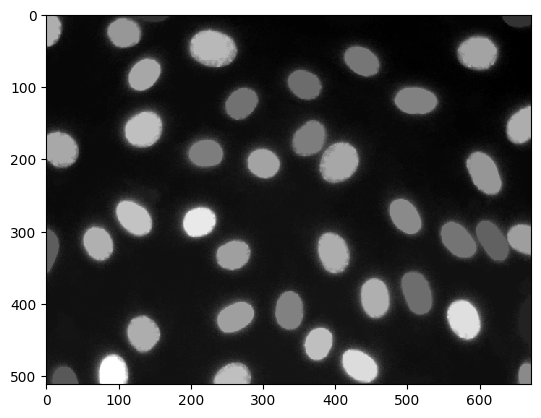

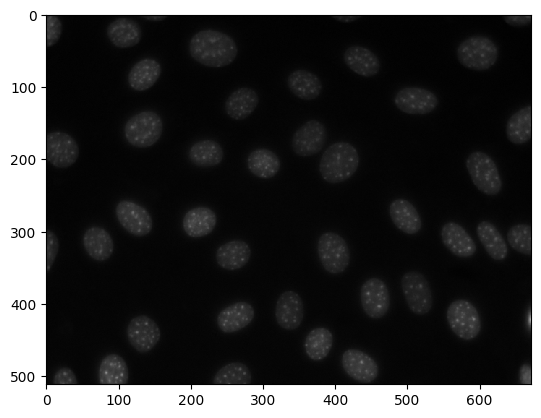

In [182]:
l1, l2, g2 = MultiResolution(ima,'alternating_rec',5,17)
display_image(l1)
display_image(l2)
display_image(g2)
display_image(l1+l2+g2)

Now the $l_1, l_2$ and $g_2$ images represent a multiscale decomposition of the original image in **size (and not frequency)** bands. The $l_1$ image involves components of small size, the  $g_2$ images has the large components and the $l_2$ image contain the components of intermediate size. 

## 4 Simplification

Use the multiscale decomposition scheme presented in the previous section to simplify as much as possible the original image before segmentation. The simplified image should concentrate as much information as possible about the objects of interest, here the cells, for the segmentation and remove as much as possible annoying or irrelevant image content. You have to define the appropriate filters and the set of parameters for the `MultiResolution` function. You will also have to decide if the simplified image is $l_1, l_2$ or $g_2$. 


/var/folders/by/2njwfm9x7sbdz_xdq73474s00000gn/T/ipykernel_16598/906983580.py:16: MatplotlibDeprecationWarning: The resize method was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use FigureManagerBase.resize instead.
  h.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)


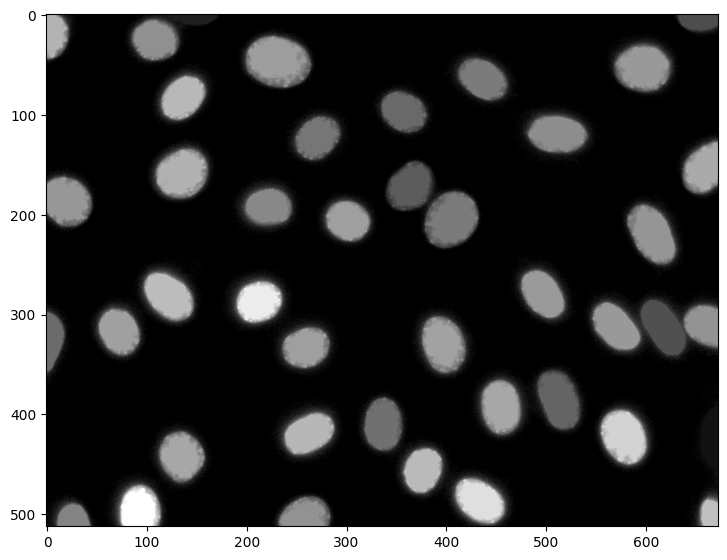

In [183]:
# Update this code and change the ??? by the appropriate values and numbers
#en segmentation lo millor es que la imatge sigui el mes binaria possible un cop simplificada
#opening per reconstruccio
#ferho los mes pla possible, tipo les celules lo mes blanc possible
#imatge 10:
l1, l2, g2 = MultiResolution(ima,'opening_rec',15,30)
#imatge22:
#l1, l2, g2 = MultiResolution(ima,'opening_rec',5,30)
#Gaussian no funciona ja que volem que la imatge sigui el mes plana possible i estem perdent molta informacio ja que queda bastant borrosa, tant la l1 com la l2 com la g2
#l1, l2, g2 = MultiResolution(ima,'gaussian',3,5)

simple = l2    # Define the simplified image l1, l2 or g2


display_image(simple,size=1)


<font color='purple'> Describe the reasoning you have done to define the simplification strategy you have used.  : </font>

---
<font color='red'>Answer: 
In this case, I chose to use an opening by reconstruction filter, which is a morphological operation that preserves the bright structures in the image while removing the dark structures. This operation is known to be effective in removing noise while preserving edges and boundaries of objects.

I chose a structuring element of size 15 for the erosion step of the opening by reconstruction filter, which will remove the small details and noise from the image, and a structuring element of size 30 for the dilation step, which will preserve the larger structures of the image. Finally, I selected the l2 image as the simplified image, as it contains the intermediate-frequency components that are likely to be most relevant for the segmentation task (in the last part of the file you can find a further explanation).

</font> 

## 5 Binarization

The first segmentation technique is a classification algorithm. It defines two classes. It is therefore a binarization. It works on a feature space represented by the histogram. A threshold is automatically (minimum of the intra-class variance also known as the Ostu technique) defined to partition this histogram and the regions are obtained by classification.


Threshold: 0.044


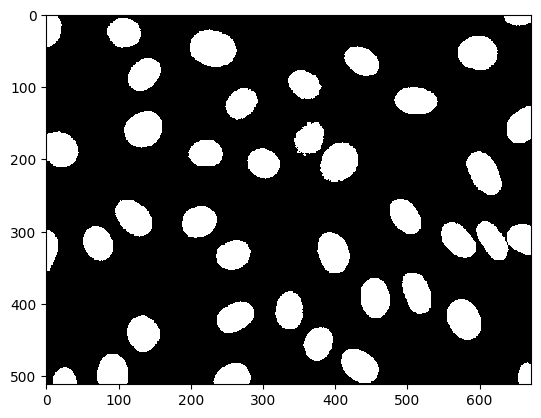

In [184]:
threshold = filters.threshold_otsu(simple)
print('Threshold:', '{:1.3f}'.format(threshold))
binarized = simple > threshold
display_image(binarized)

<font color='purple'> Discuss the problems that you may have encountered using this approach. Try to relate the observed problems with weak points of the classification algorithms we have discussed during the lecture: </font>

---
<font color='red'>Answer: 

The problems observed in the binarization step can be related to the weak points of the classification algorithms discussed before, especially when applied to images with low contrast or uneven illumination.

The thresholding approach is sensitive to changes in illumination and contrast, as well as to noise, which can affect the threshold selection and lead to poor segmentation results. In the case of cell images, the presence of variations in illumination and contrast, as well as the presence of overlapping cells or cells with similar texture, can make it difficult to find a suitable threshold that separates the objects of interest from the background.

Additionally, the binarization step assumes that the objects of interest are uniformly brighter or darker than the background, which may not always be the case. In this kind of images, for example, the cells have different shapes, sizes, and intensities, and some cells may have a similar or even lower intensity than the background. This can result in the loss of information or segmentation errors if a global threshold is used. Furthermore, in some images there is a problem with this approach when it comes to the contour of the cells, as they appear a little blurry and less defined.

In other words, Otsu's method  assumes that the image has a bimodal histogram, meaning that the image can be separated into two distinct classes. However, in real-world scenarios, the image histograms can be complex and may not follow a bimodal distribution. In such cases, the automatic threshold obtained by Otsu's method may not be suitable for the image, leading to errors in the segmentation. Moreover, the Otsu's method can be sensitive to noise in the image. If the image contains a significant amount of noise, it can result in a high variance in the pixel intensity values, which can lead to an inaccurate threshold value.



</font> 

## 6 Active contours

The transition detection approach we are going to use in this section relies on active contours. Segment the simplified image with the active contours technique. This approach optimizes a curve so that it fits with points of high gradient and minimizes its curvature. The initial curve is defined as the border of the image. The algorithm  computes a given number of iteration defined by the `Niter` parameter and then visualize the resulting partition. 


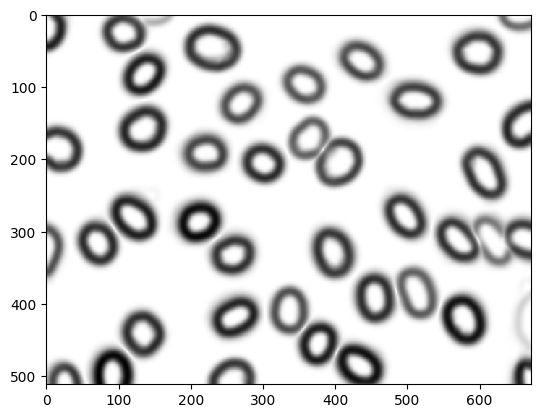

Number of regions: 28


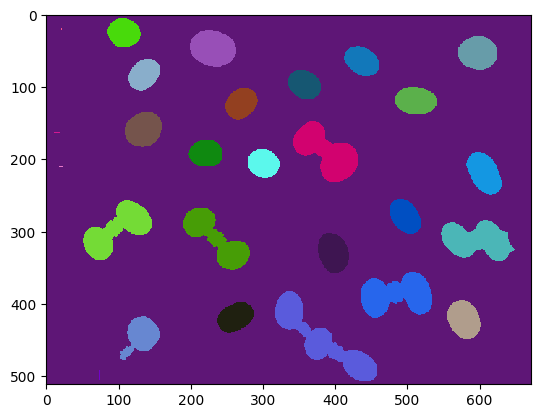

In [185]:
# Active Contour
from skimage.segmentation import (morphological_geodesic_active_contour,
                                  inverse_gaussian_gradient)
def store_evolution_in(lst):
    def _store(x):
        lst.append(np.copy(x))

    return _store
  
Niter  = 350      # Define the number of iteration
image  = simple

# Compute the inverse of the gradient
gimage = inverse_gaussian_gradient(image,alpha=200,sigma=4.0)
display_image(gimage)

# Initial contour (border of the image)
init_contour = np.zeros(image.shape, dtype=np.int8)
init_contour[0:-1, 0:-1] = 1

# Compute the segmentation with active contours
# The "callback" and "evolution" are used to store intermediate results for 
# plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
ls = morphological_geodesic_active_contour(gimage, Niter, init_contour,
     balloon=-1, iter_callback=callback)

labels = measure.label(ls,connectivity=1)
print('Number of regions: {:}'.format(np.amax(labels)))
display_label(labels)

The following lines of code can be used to study the temporal evolution of the contours. They create an animation showing the image and some steps of the algorithm.

In [186]:
from matplotlib import animation, rc
from IPython.display import HTML

# First set up the figure, the axes, and the plot element
fig, ax = plt.subplots()
plt.close()
ax.imshow(image, cmap="gray")
ax.set_axis_off()

# initialization function: plot the background of each frame
def init():
    global image
    ax.imshow(image, cmap="gray")      
    return ()
  
# animation function: this is called sequentially
def animate(i):
  global evolution
  global Niter
  global image
  n = int(round(i*Niter/30))
  if i>0:
    n1 = int(round((i-1)*Niter/30))
    cont1 = ax.contour(evolution[n1], [0.5], colors='g', alpha=0.5)
  ax.imshow(image, cmap="gray")
  cont2 = ax.contour(evolution[n], [0.5], colors='r', alpha=1)
  ax.set_title('Iteration {:}'.format(n), fontsize=12)
  return ()

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=30, blit=True)

rc('animation', html='jshtml')
anim

As can be seen the `Niter` value initially defined as 50 is not enough to reach convergence. Define this number appropriately to be sure that the algorithm has reached convergence.  

<font color='purple'>Comments the quality of the results. Try to relate the observed results with what you know from the course about this algorithm. In particular, the curve evolution is governed by two forces (internal and external). Can you observe some drawbacks resulting from one of these forces? Which one? Explain? : </font>

---
<font color='red'>Answer: 
After experimenting with different values of Niter, it seems that a value of 350 is appropriate for this specific image to reach convergence. The resulting segmentation seems to be fairly accurate, although there are some minor errors, such as small holes inside the segmented regions.

In this algorithm, the curve evolution is governed by two forces: internal and external. The internal force is related to the elasticity of the curve, which minimizes its length, while the external force is related to the gradient of the image, which attracts the curve towards points of high gradient. The balance between these two forces is important for the algorithm to converge to an accurate segmentation.

In this particular case, it seems that the internal force is too strong compared to the external force, which results in some minor errors in the segmentation. This can be observed from the fact that some small holes inside the segmented regions are not properly filled (spaces between two cells that are very colse to one an other), which indicates that the curve does not adapt well to points of high gradient. In some cases, this can be compensated by adjusting the parameters of the algorithm, but in general, this is a limitation of the algorithm.
</font> 

## 7 Region growing with watershed 
This technique works directly on the image space. This approach relies on the creation of an initial partition defining the core of region we want to segment. The complement of the initial partition represents the uncertainty area that will progressively disappear through the assignment of pixels to regions following a homogeneity criterion. 

As seen in the course, the watershed is a morphological region growing approach that works on the gradient of the image to segment. Moreover, it assumes that the seeds of the growing process are the gradient minima. 

Let us first compute the gradient with a sobel filter and then apply the watershed. 

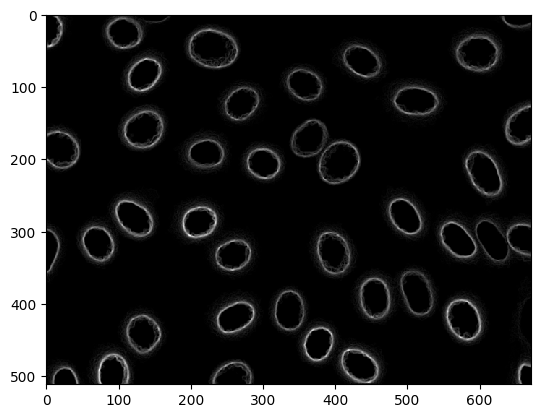

Number of regions: 8156


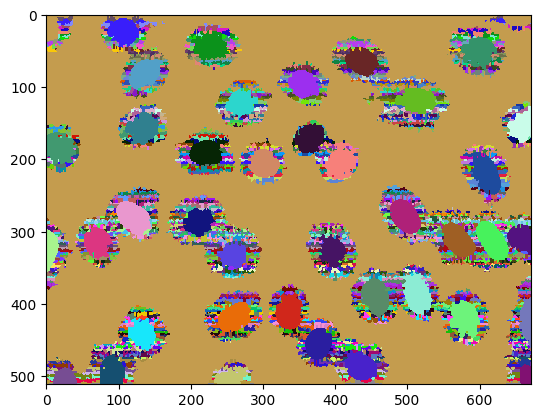

In [187]:
gradient = filters.sobel(simple)
display_image(gradient)

labels = segmentation.watershed(gradient)
print('Number of regions: {:}'.format(np.amax(labels)))
display_label(labels)

<font color='purple'>As can be seen the number of regions is extremely high. Was this expected? Why? : </font>

---
<font color='red'>Answer: 
This is because watershed segmentation can lead to over-segmentation, where the algorithm assigns a unique label to each local minimum in the gradient image. In other words, each small region corresponds to a local minimum in the gradient of the image. 
Yes, this was expected. The watershed algorithm applied directly to the gradient image usually produces an oversegmentation. This is because the gradient is a very sensitive measure of intensity variation and often detects small changes in intensity that are not necessarily meaningful. The watershed algorithm then tries to partition the image into regions based on these small changes, resulting in the oversegmentation. In other words, it assigns a unique label to each local minimum in the gradien image (every region corresponds to a local minimum in the gradient)
</font> 

As a matter of fact,  we would like to use as marker the important minima of the image gradient instead of all minima. To this end, we are going to use a filter by reconstruction that is sensitive to contrast. We have seen in the course a contrast-oriented operator that removes maxima of low contrast. The strategy consists in subtracting a constant $c$ from the original image and to perform a reconstruction: $\gamma_{rec}(f,f-c)$. Here we are going to use the dual operator: $\varphi_{rec}(f,f+c)$ to remove minima of contrast lower than c ($\varphi_{rec}$ is the dual reconstruction, the one using geodesic erosions). The markers are defined as the minima of the filtered gradient. The following figure illustrates the process:



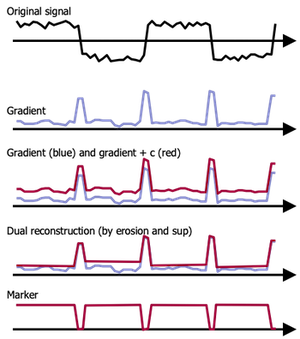



In this figure, one can see how the gradient minima of low contrast are removed by the filter by reconstruction. The simplified gradient only contains minima of high contrast. Those minima are used as marker or initial partition. 


Create the initial partition optimizing the contrast parameter. **Note:** The initial value of 0.001 is not the optimum one. 

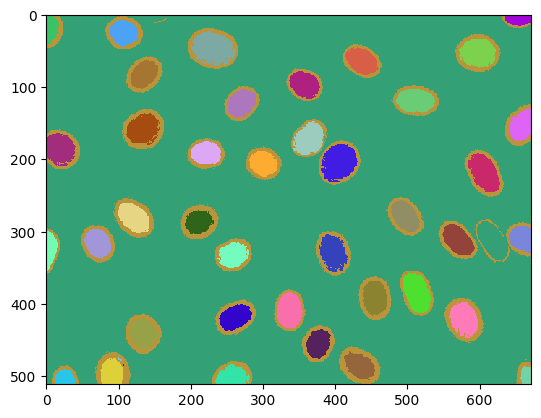

Number of regions: 42


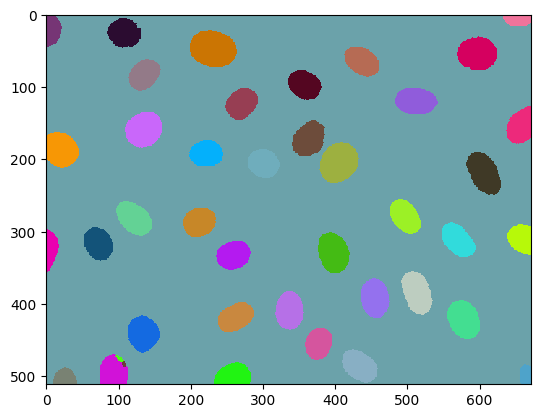

Number of regions: 42


In [196]:
# Modify the contrast value to get the best result 
#imatge2 10:
contrast = 0.009
#contrast = 0.015
tmp = gradient + contrast
tmp = morphology.reconstruction(tmp,gradient,method='erosion')
markers = morphology.local_minima(tmp,connectivity=2)

# Assign a different value for each connected component
markers = measure.label(markers,connectivity=2)
display_label(markers)
print('Number of regions: {:}'.format(np.amax(markers)))

labels = segmentation.watershed(gradient,markers)
display_label(labels)
print('Number of regions: {:}'.format(np.amax(labels)))

<font color='purple'>Comments the quality of the results and try to relate the observed results with what you know from the course about this algorithm: </font>

---
<font color='red'>Answer:
The results with marker extraction using the contrast filter by reconstruction are visually good, with most of the regions well defined and meaningful. However, in some trials I have appreciated that there are some regions that are not well separated, probably due to the presence of gradients that are not well defined or that do not have a high contrast with their neighbours.
For example in botom left of image 10 there is more than one region detected in the same cell. 

Normally, the watershed algorithm with marker extraction is a segmentation technique that can accurately detect object boundaries and segment images into meaningful regions. However, it is highly dependent on the quality of the markers, which need to be located in meaningful places and provide a good initial partition of the image. Additionally, the use of the gradient can be problematic when the image contains noise or when the boundaries are not well defined, leading to over-segmentation or under-segmentation.


</font> 

As you can see, the algorithm has merged some of the cells and broken others in several places. In order to clean this result, we are going to use a classical strategy for morphological segmentation: We are going to consider this initial segmentation as an approximation and use it essentially to better estimate the marker and run again the watershed.

First we would like to define the background marker. To the end we will search for the region involving the largest number of pixles and assume that this is the background. This information can be extracted from the measure.regionprops. 

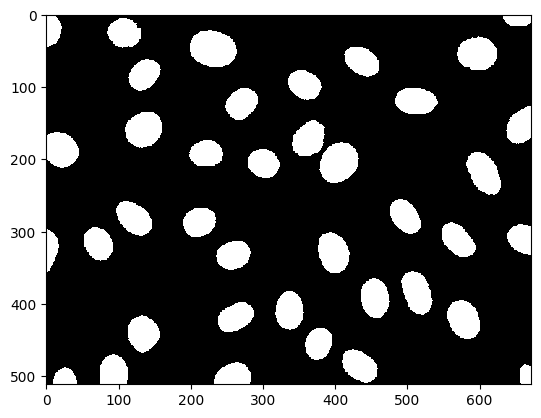

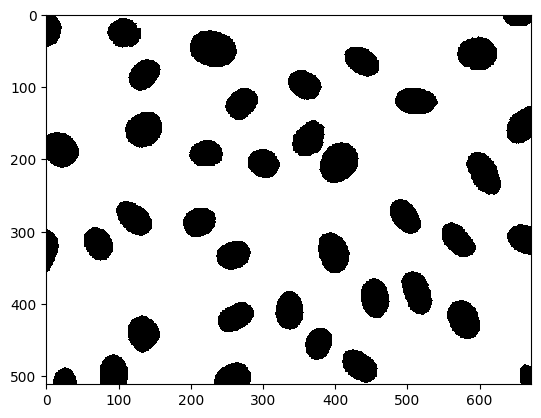

In [189]:
props = measure.regionprops(labels)
background_Label = np.argmax([i.area for i in props])+1
 
foreground = np.zeros_like(labels)
background = np.zeros_like(labels)
 
foreground[labels!=background_Label] = 1
background[labels==background_Label] = 1
display_image(foreground)
display_image(background)

The complementary of the background is the foreground. In order to define markers in the center of the cells appearing in the foreground image, we are going to compute the distance transform. This transform creates a gray level image that looks similar to the input binary image, except that the gray levels of points inside foreground regions are changed to show the distance to the closest boundary from each point.

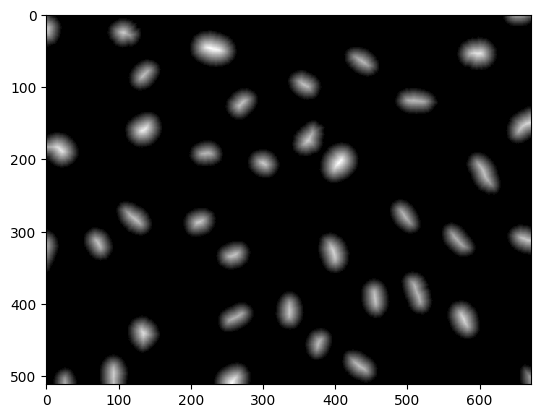

In [190]:
distance = nd.distance_transform_edt(foreground)
display_image(distance)

This distance transform  is useful here to locate the cell centers as they correspond to the maxima of the distance transform. We extract these maxima with a contrast operator and merge them with the background marker.

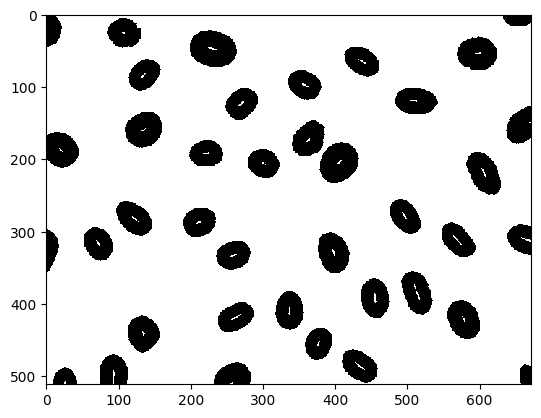

In [191]:
contrast = 1
tmp      = distance - contrast
distance = morphology.reconstruction(tmp,distance,method='dilation')
markers  = morphology.local_maxima(distance,connectivity=2)
display_image(markers+background)



Finally, we apply the final watershed with these markers. 

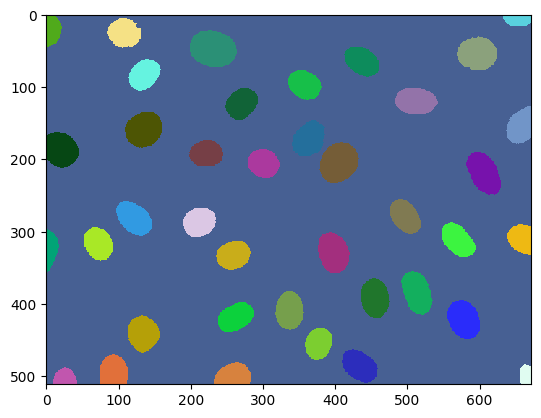

Number of regions: 40


In [192]:
markers = measure.label(markers+background,connectivity=2)
labels1 = segmentation.watershed(gradient,markers)
display_label(labels1)
print('Number of regions: {:}'.format(np.amax(labels1)))

<font color='purple'>Comments the quality of the results: </font>

---
<font color='red'>Answer: 
After experimenting with different contrsats now the segmentation seems cleaner and closer to the ground truth. However, in some cases there are still some segmentation errors where two cells are merged together or a single cell is split into two parts. This is mainly due to the fact that some cells are in contact with each other and share common boundaries.
It can be seen that the segmentation works pretty well as it is able to differentiate the different cells although given the problems stated before. We have erased the error of putting more than one region in the same cell so it is an improvement.
</font> 

## 8 Additional experiments
In this section, you asked to redo the previous experiments with two addtional images of the dataset. The idea is to come up with a simplifcation strategy, a segmentation algorithm and their associated parameters that work well for the entire database. You may have noted that some images involve a non constant background. This is in particular the case for images 19, 22, 23, 27 and 28. So if you have not selected one of these images in the first set of experiment, choose at least one of these images for the experiment of this section. 

After experimenting with these additional images, you are asked to define what you consider as being the best algorithm to segment an arbtrary image of this dataset.  

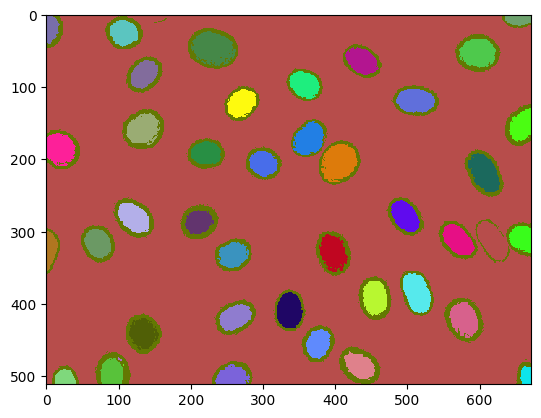

Number of regions: 42


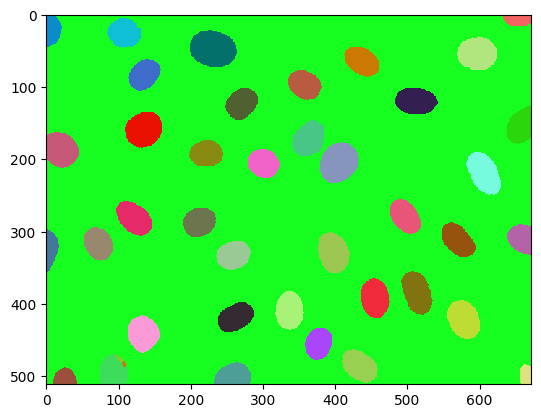

Number of regions: 42


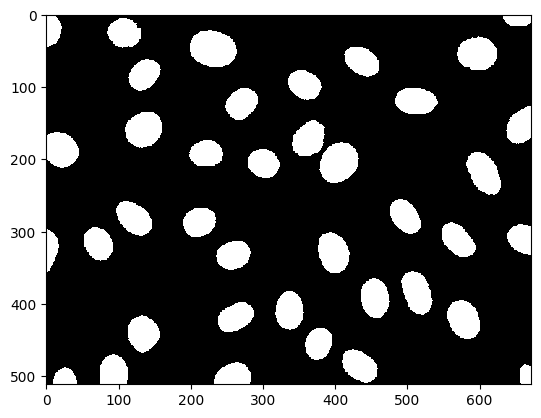

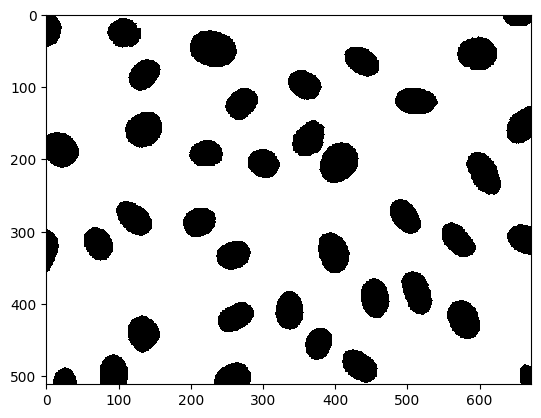

In [197]:
# Include here the code of the algorithm you have defined.
l1, l2, g2 = MultiResolution(ima,'opening_rec',15,30)
simple = l2 
# Modify the contrast value to get the best result 
#imatge2 10:
contrast = 0.009
#contrast = 0.015
tmp = gradient + contrast
tmp = morphology.reconstruction(tmp,gradient,method='erosion')
markers = morphology.local_minima(tmp,connectivity=2)

# Assign a different value for each connected component
markers = measure.label(markers,connectivity=2)
display_label(markers)
print('Number of regions: {:}'.format(np.amax(markers)))

labels = segmentation.watershed(gradient,markers)
display_label(labels)
print('Number of regions: {:}'.format(np.amax(labels)))
props = measure.regionprops(labels)
background_Label = np.argmax([i.area for i in props])+1
 
foreground = np.zeros_like(labels)
background = np.zeros_like(labels)
 
foreground[labels!=background_Label] = 1
background[labels==background_Label] = 1
display_image(foreground)
display_image(background)

distance = nd.distance_transform_edt(foreground)

contrast = 1
tmp      = distance - contrast
distance = morphology.reconstruction(tmp,distance,method='dilation')
markers  = morphology.local_maxima(distance,connectivity=2)

markers = measure.label(markers+background,connectivity=2)
labels1 = segmentation.watershed(gradient,markers)

<font color='purple'>Comments your main choices to define this algorithm: </font>

---
<font color='red'>Answer: 
After several trials with different images of the dataset, I think that the best algorithm to segment an arbitrary image is the following:
- For the image simplification use two filters of opening by reconstruction. In F1 use a structurant element smaller than the cells but bigger than the noise, this way it mantains the cells and erase the noise in the image. Apply F2 with a structurant element bigger than the cells in the image, this way g2 has the background of the image. Finally, use l2 for the algorithm, as it is g2-l1. This way if the background is not uniform, we erase the distortion of light in the image and obtain an image as binary as possible for its segmentation. (Tune the se sizes to achieve the best result).
- Apply watershed filters using markers as  seen in the executions. Use a contrast high enough so that does not oversegment the image and low enough so that does not undersegment the cells. 

Having said this, with images like the ones mentioned in the statement, there is noise bigger than the cells which we can not erase with the code of this notebook (as we would be erasing the cells to), so in the trials I tried to minimiz it, using the same reasoningas before.
It is important to note that for some images one algorithm works better than the other. For example, the binarization work pretty well with imae 10 but horribly with image 22, but overall the best algorithm is the one described. 

</font> 